In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_device(device)
device

device(type='cuda')

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
drive_path = '/content/drive/MyDrive/'

Mounted at /content/drive


In [4]:
# desired size of the output image
imsize = 512 if torch.cuda.is_available() else 128  # use small size if no GPU

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor



def image_loader(image_name):
    image = Image.open(image_name)
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


style_img = image_loader(drive_path + "picasso.jpg")
content_img = image_loader(drive_path + "dancing.jpg")

assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"

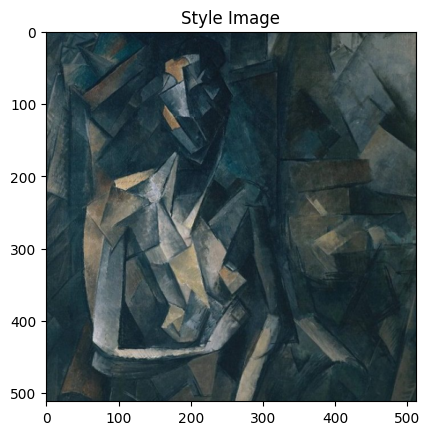

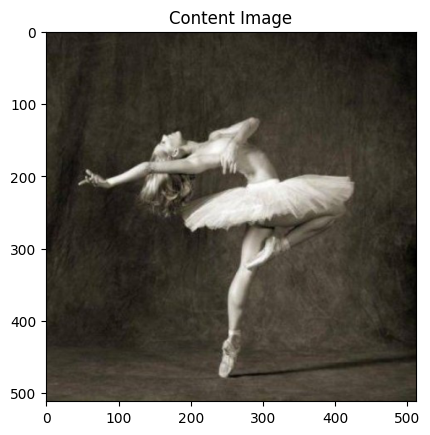

In [5]:
unloader = transforms.ToPILImage()  # reconvert into PIL image

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated


plt.figure()
imshow(style_img, title='Style Image')
plt.figure()
imshow(content_img, title='Content Image')

In [6]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [7]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach() ## gram loss
    #     self.mean_target, self.var_target = compute_variance_and_mean(target_feature)
    #     self.mean_target = self.mean_target.detach()
    #     self.var_target = self.var_target.detach()


    # def forward(self, input):
    #         mean, var = compute_variance_and_mean(input)
    #         self.loss = F.mse_loss(mean, self.mean_target) + F.mse_loss(var, self.var_target)
    #         return input

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [8]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resize F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

In [9]:
def compute_variance_and_mean(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)
    mean_target = torch.mean(input, dim=[2, 3], keepdim=True)
    tensor = input.view(a * b, c * d)
    var_target = torch.var(tensor, dim=1, keepdim=True).view(a, b, 1, 1)
    return mean_target, var_target

In [10]:
from torchvision.models import VGG19_Weights

cnn = models.vgg19(weights=VGG19_Weights.DEFAULT).features.eval()

In [11]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])

# create a module to normalize input image so we can easily put it in a
# ``nn.Sequential``
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize ``img``
        return (img - self.mean) / self.std

In [12]:
# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std)

    # just in order to have an iterable access to or list of content/style
    # losses
    content_losses = []
    style_losses = []

    # assuming that ``cnn`` is a ``nn.Sequential``, so we make a new ``nn.Sequential``
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)
    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ``ContentLoss``
            # and ``StyleLoss`` we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)


        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]
    return model, style_losses, content_losses

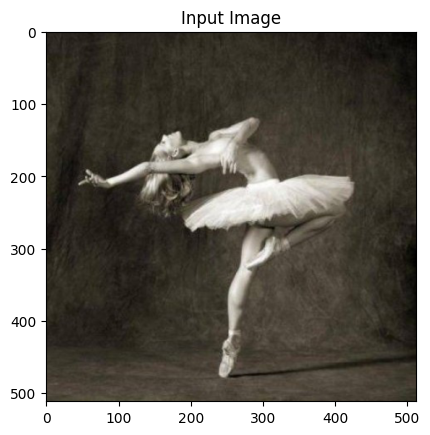

In [13]:
input_img = content_img.clone()
# if you want to use white noise by using the following code:
#
# ::
#
# input_img = torch.randn(content_img.data.size())

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')

In [14]:
def get_input_optimizer(input_img):
    optimizer = optim.LBFGS([input_img])
    return optimizer

In [52]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=180,
                       style_weight=1000000, content_weight=1):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    # We also put the model in evaluation mode, so that specific layers
    # such as dropout or batch normalization layers behave correctly.
    model.eval()
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()
            # style_score.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                # print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                #     style_score.item(), content_score.item()))
                print(style_score.item())

            return style_score

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

Building the style transfer model..


/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
4.128047943115234
run [100]:
1.1027508974075317
run [150]:
0.6921237707138062
run [200]:
0.46360811591148376


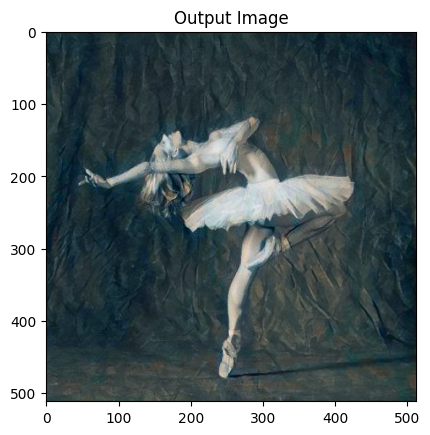

In [16]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img)

plt.figure()
imshow(output, title='Output Image')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

In [17]:
from PIL import Image
import torch
!pip install diffusers
!pip install transformers

from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae").to(device)
tokenizer = CLIPTokenizer.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="text_encoder").to(device)
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet").to(device)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


In [18]:
from diffusers import UniPCMultistepScheduler

scheduler = UniPCMultistepScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

In [144]:
height = imsize
width = imsize
num_inference_steps = 25  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
prompt = ["a photograph of an astronaut riding a horse"]
batch_size = len(prompt)
generator = torch.cuda.manual_seed(1)  # Seed generator to create the inital latent noise

In [20]:
text_input = tokenizer(
    prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt"
)

with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(device))[0]

In [21]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]

In [22]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

In [23]:
def generate_clean_img(i, input):
  n_input = input
  for t in scheduler.timesteps[i:]:
        with torch.no_grad():
            noisy_residual = unet(n_input, t, text_embeddings).sample
        previous_noisy_sample = scheduler.step(noisy_residual, t, n_input).prev_sample
        n_input = previous_noisy_sample
  return latent_to_img(n_input)

In [24]:
def latent_to_img(input):
  # scale and decode the image latents with vae
  input = 1 / 0.18215 * input
  with torch.no_grad():
    res = vae.decode(input).sample
  return (res / 2 + 0.5).clamp(0, 1)

In [25]:
def pil_to_latents(image):
    '''
    Function to convert image to latents
    '''
    return vae.encode(image * 2.0 - 1.0).latent_dist.sample() * 0.18215

In [26]:
def plot_img(image):
  image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
  images = (image * 255).round().astype("uint8")
  pil_images = [Image.fromarray(image) for image in images]
  pil_images[0]


In [27]:
def show_img(latents):
    image = latent_to_img(latents)
    imshow(image)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    pil_images[0]
    imshow(pil_images[0])

In [145]:
latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
)
latents_init = latents.to(device)
latents_init = latents_init * scheduler.init_noise_sigma


<ipython-input-145-1c873fde6416>:2: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


In [168]:
from tqdm.auto import tqdm
def learn_latents_without_style_injection(latents):
    scheduler.set_timesteps(num_inference_steps)

    style_model, style_losses, content_losses = get_style_model_and_losses(cnn, cnn_normalization_mean, cnn_normalization_std, content_img, style_img)
    style_model.eval()
    style_model.requires_grad_(False)
    style_weight=1000000
    i = -1
    for t in (scheduler.timesteps):
        i += 1
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)

        latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)
        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
        # compute the previous noisy sample x_t -> x_t-1
        new_latents = scheduler.step(noise_pred, t, latents).prev_sample
        # mean_latent = scheduler.convert_model_output(noise_pred, t, latents)
        with torch.no_grad():
          mean_img = latent_to_img(new_latents).to(device)
          imshow(mean_img)
          imshow(latent_to_img(pil_to_latents(mean_img)))
        # latents = pil_to_latents(mean_img)
        # stear the latents towards the style of the style image
        # optimizer = get_input_optimizer(mean_img)
        mean_img.requires_grad = True
        # def clos():
        #   optimizer.zero_grad()
        style_model(mean_img)
        style_score = 0
        for sl in style_losses:
            style_score += sl.loss
        style_score *= style_weight
        style_score.backward()
        # with torch.no_grad():
          # latents = pil_to_latents(latent_to_img(new_latents) + 0.01 * mean_img.grad)
          # latents = pil_to_latents(latent_to_img(new_latents))
          # return style_score
          # latents = scheduler.step(noise_pred + pil_to_latents(mean_img.grad), t, latents).prev_sample
        # latents = new_latents
        # optimizer.step(clos)
        # with torch.no_grad():
        #   mean_latent = pil_to_latents(mean_img)
        latents = new_latents
    return latents
criterion_l2 = nn.MSELoss()

def learn_latents_with_style_injection(latents):
    scheduler.set_timesteps(num_inference_steps)

    style_model, style_losses, content_losses = get_style_model_and_losses(cnn, cnn_normalization_mean, cnn_normalization_std, content_img, style_img)
    style_model.eval()
    style_model.requires_grad_(False)
    style_weight=1
    i = -1
    for t in (scheduler.timesteps):
        i += 1
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)

        latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)
        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
        # compute the previous noisy sample x_t -> x_t-1
        new_latents = scheduler.step(noise_pred, t, latents).prev_sample
        # mean_latent = scheduler.convert_model_output(noise_pred, t, new_latents)
        with torch.no_grad():
            mean_img = latent_to_img(new_latents).to(device)
            imshow(mean_img)
            styled_mean_img = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       mean_img, style_img, mean_img, num_steps=180,
                       style_weight=1000000, content_weight=1)
            latents_mean_img = pil_to_latents(mean_img)
            latents_styled_mean_img = pil_to_latents(styled_mean_img)

        latents_mean_img.requires_grad = True
        latents_styled_mean_img.requires_grad = True
        # print(latents_mean_img)
        # print(latents_styled_mean_img)
        loss = criterion_l2(latents_mean_img, latents_styled_mean_img)
        # Perform backward pass to compute gradients
        loss.backward()
        # print(latents_mean_img.grad)
        # print(latents_styled_mean_img.grad)
        # Update the image1 tensor using gradient descent
        learning_rate = 10000000
        new_latents -= learning_rate * latents_mean_img.grad

            # mean_img.requires_grad_(True)
            # style_model, style_losses, content_losses = get_style_model_and_losses(cnn, cnn_normalization_mean, cnn_normalization_std, style_img, mean_img)
            # style_model.eval()
            # style_model.requires_grad_(True)
            # for sl in style_losses:
            #     sl.loss.requires_grad_(True)
            # print(mean_img)
            # style_weight=1
            # style_model(mean_img)
            # style_score = 0
            # # print(mean_img)
            # # style_score.requires_grad_(True)
            # for sl in style_losses:
            #     sl.loss.backward()
            # # style_score *= style_weight
            # # style_score.backward()
            # # print(mean_img)
        latents = new_latents
    return latents


In [157]:
latents = torch.tensor(latents_init)
latents2 = torch.tensor(latents_init)

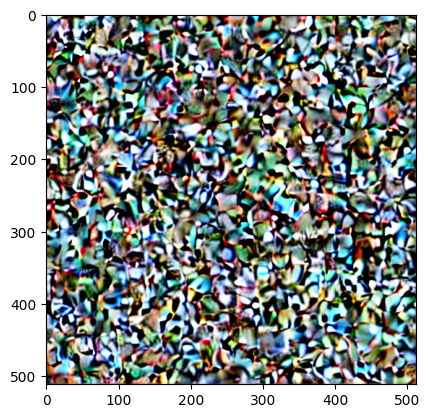

Building the style transfer model..
Optimizing..
run [50]:
99.3690185546875
run [100]:
51.9991340637207
run [150]:
20.20421600341797
run [200]:
6.647365093231201


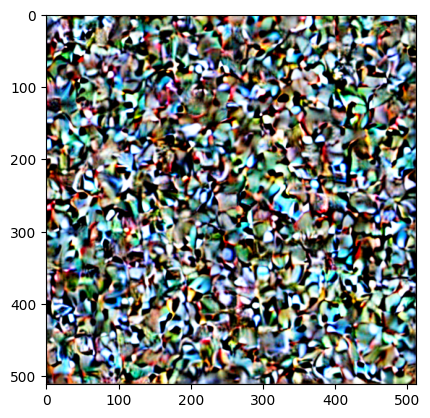

Building the style transfer model..
Optimizing..
run [50]:
98.0376205444336
run [100]:
51.858726501464844
run [150]:
20.801008224487305
run [200]:
6.781066417694092


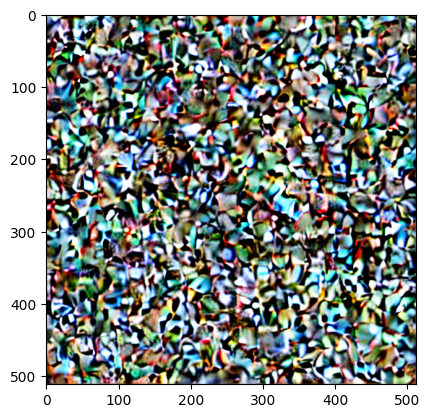

Building the style transfer model..
Optimizing..
run [50]:
95.99076080322266
run [100]:
49.19375991821289
run [150]:
19.162405014038086
run [200]:
6.442594528198242


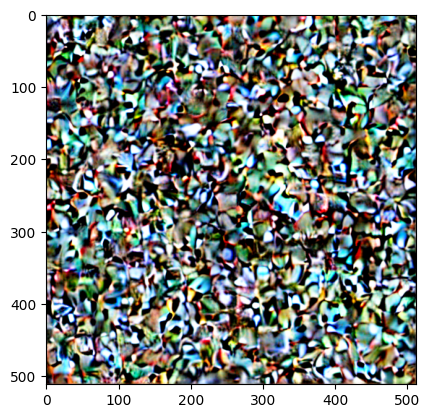

Building the style transfer model..
Optimizing..
run [50]:
92.8302993774414
run [100]:
46.567474365234375
run [150]:
17.850934982299805
run [200]:
6.185095310211182


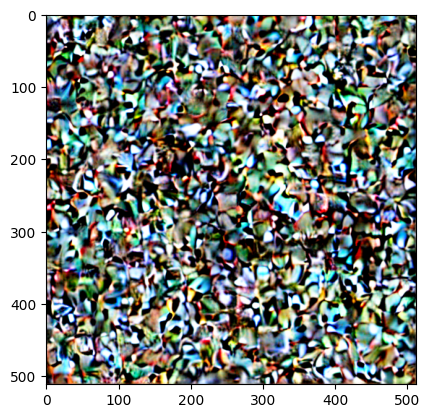

Building the style transfer model..
Optimizing..
run [50]:
91.04869079589844
run [100]:
45.16439437866211
run [150]:
17.357500076293945
run [200]:
6.668317794799805


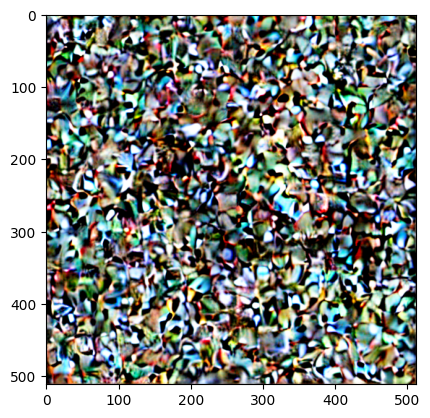

Building the style transfer model..
Optimizing..
run [50]:
86.96549987792969
run [100]:
42.614295959472656
run [150]:
17.41971778869629
run [200]:
6.808348178863525


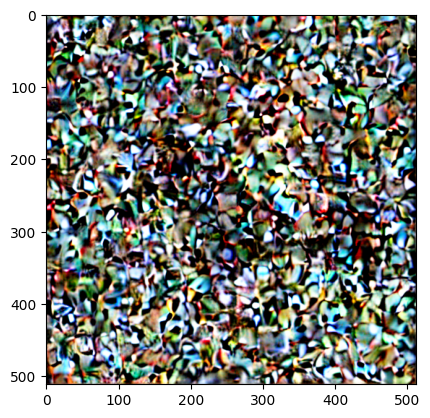

Building the style transfer model..
Optimizing..
run [50]:
81.4844741821289
run [100]:
39.178096771240234
run [150]:
15.854538917541504
run [200]:
6.366966724395752


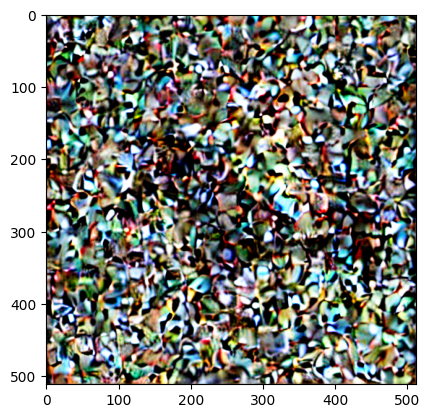

Building the style transfer model..
Optimizing..
run [50]:
79.34566497802734
run [100]:
36.85541915893555
run [150]:
14.951231002807617
run [200]:
6.460345268249512


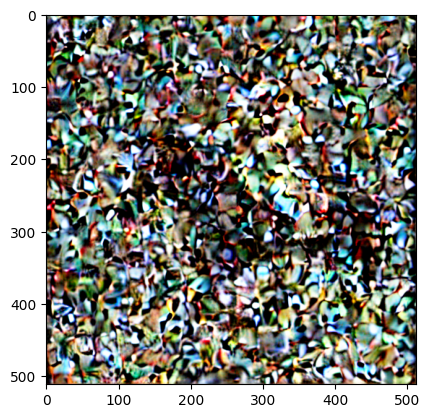

Building the style transfer model..
Optimizing..
run [50]:
72.23456573486328
run [100]:
32.99236297607422
run [150]:
14.331031799316406
run [200]:
6.333391189575195


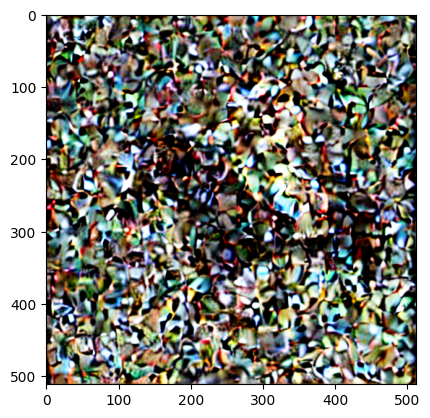

Building the style transfer model..
Optimizing..
run [50]:
67.7380599975586
run [100]:
30.7563533782959
run [150]:
13.36212158203125
run [200]:
6.123725414276123


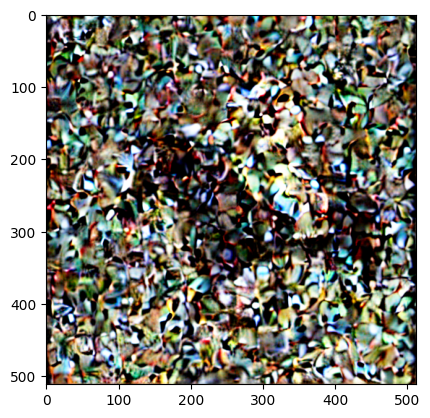

Building the style transfer model..
Optimizing..
run [50]:
61.57785415649414
run [100]:
28.102611541748047
run [150]:
12.073029518127441
run [200]:
5.812378406524658


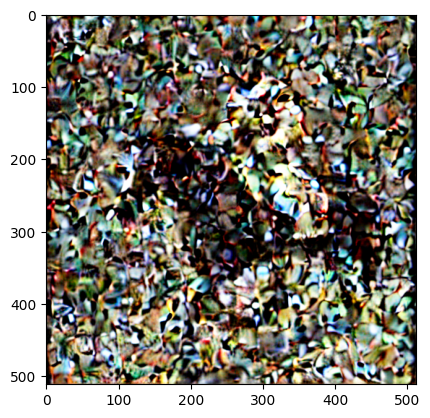

Building the style transfer model..
Optimizing..
run [50]:
55.90510940551758
run [100]:
25.31998062133789
run [150]:
11.34713077545166
run [200]:
5.721373081207275


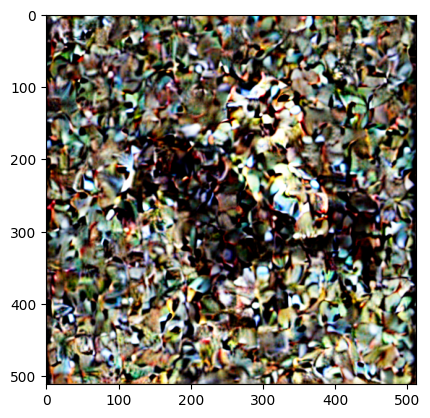

Building the style transfer model..
Optimizing..
run [50]:
50.35897445678711
run [100]:
22.94109344482422
run [150]:
10.424665451049805
run [200]:
5.227023124694824


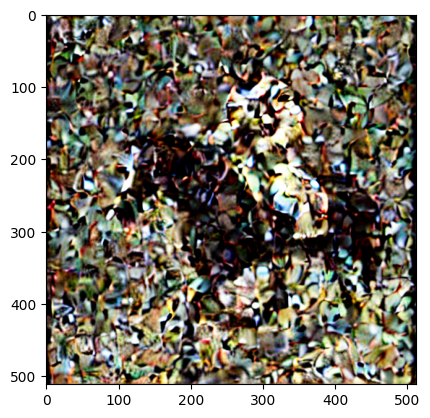

Building the style transfer model..
Optimizing..
run [50]:
46.5244026184082
run [100]:
21.421092987060547
run [150]:
9.944971084594727
run [200]:
5.233157634735107


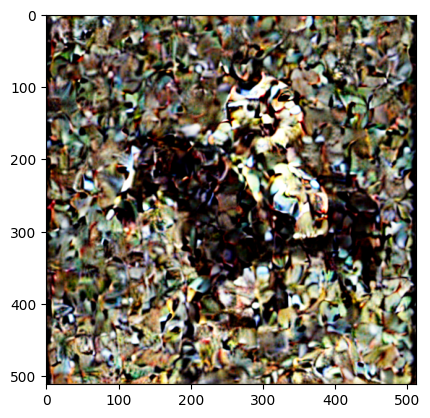

Building the style transfer model..
Optimizing..
run [50]:
42.32529830932617
run [100]:
19.982852935791016
run [150]:
9.500428199768066
run [200]:
4.884402275085449


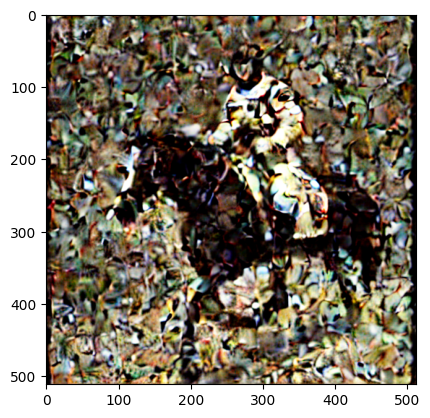

Building the style transfer model..
Optimizing..
run [50]:
40.43389892578125
run [100]:
18.817523956298828
run [150]:
8.897823333740234
run [200]:
4.713091850280762


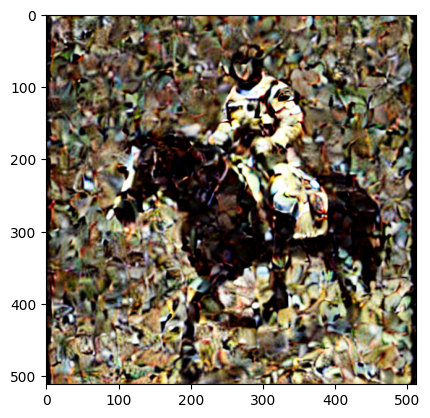

Building the style transfer model..
Optimizing..
run [50]:
39.79286575317383
run [100]:
17.961185455322266
run [150]:
8.357885360717773
run [200]:
4.563361644744873


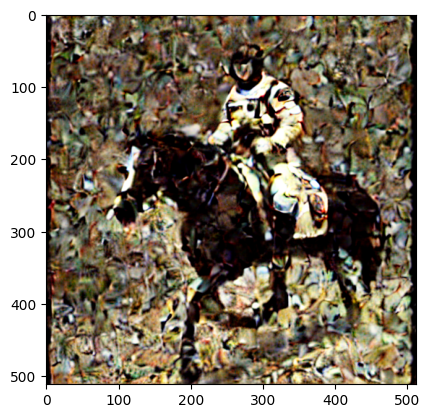

Building the style transfer model..
Optimizing..
run [50]:
37.31712341308594
run [100]:
17.658445358276367
run [150]:
8.347811698913574
run [200]:
4.54332160949707


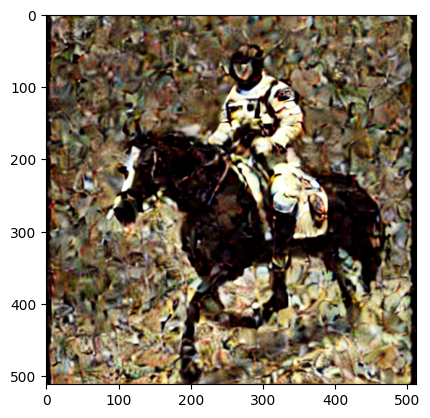

Building the style transfer model..
Optimizing..
run [50]:
36.8460578918457
run [100]:
17.25252342224121
run [150]:
7.937821388244629
run [200]:
4.308187007904053


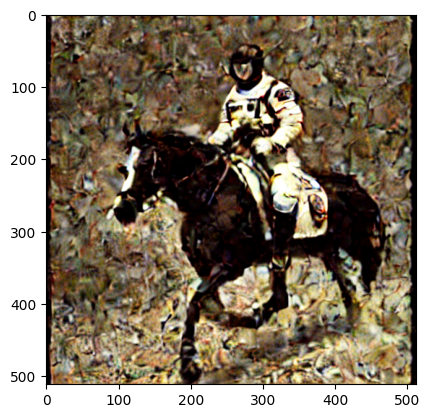

Building the style transfer model..
Optimizing..
run [50]:
43.68205261230469
run [100]:
16.773033142089844
run [150]:
7.902544975280762
run [200]:
4.247591495513916


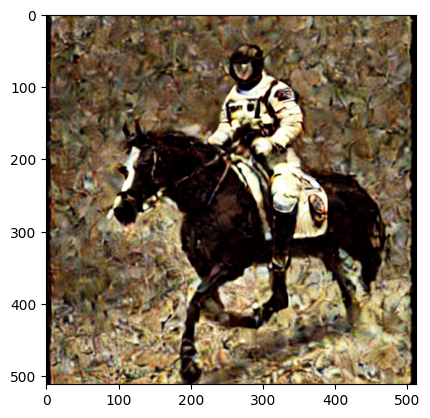

Building the style transfer model..
Optimizing..
run [50]:
41.24164581298828
run [100]:
16.831161499023438
run [150]:
8.090826988220215
run [200]:
4.352308750152588


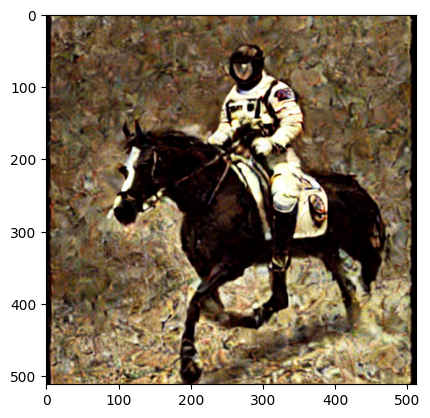

Building the style transfer model..
Optimizing..
run [50]:
42.20303726196289
run [100]:
16.87355613708496
run [150]:
7.747769832611084
run [200]:
4.194794654846191


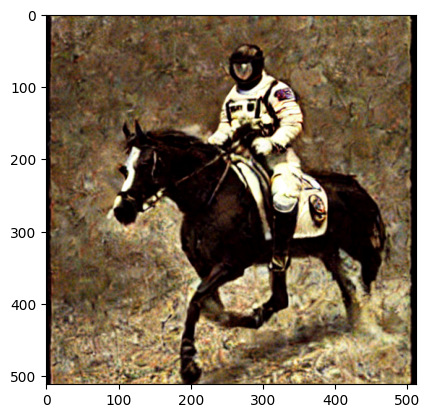

Building the style transfer model..
Optimizing..
run [50]:
46.1417350769043
run [100]:
17.1124324798584
run [150]:
7.9648542404174805
run [200]:
4.286667346954346


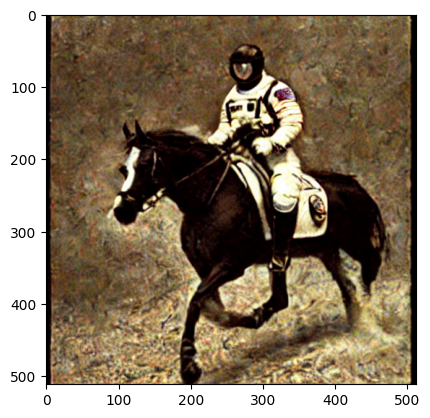

Building the style transfer model..
Optimizing..
run [50]:
44.27659225463867
run [100]:
17.110416412353516
run [150]:
8.00161361694336
run [200]:
4.39148473739624


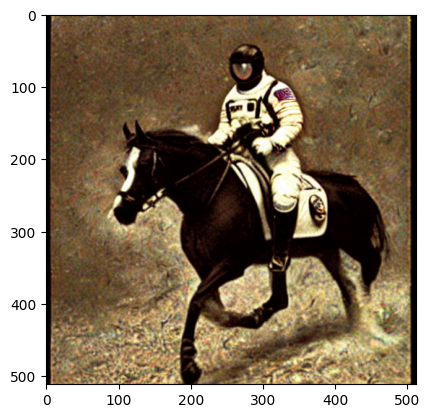

Building the style transfer model..
Optimizing..
run [50]:
48.27347946166992
run [100]:
17.834102630615234
run [150]:
8.086013793945312
run [200]:
4.524025917053223


In [169]:
# latents_orig = learn_latents_without_style_injection(latents)
latents_styled = learn_latents_with_style_injection(latents2)

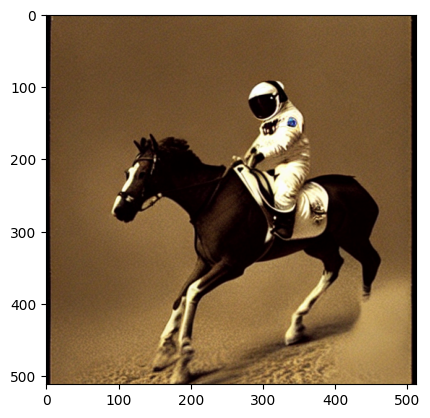

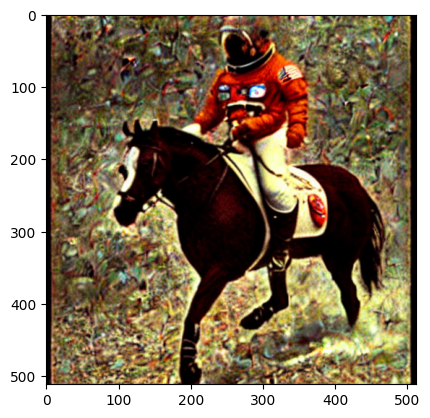

Building the style transfer model..
Optimizing..
run [50]:
58.53790283203125
run [100]:
18.059749603271484


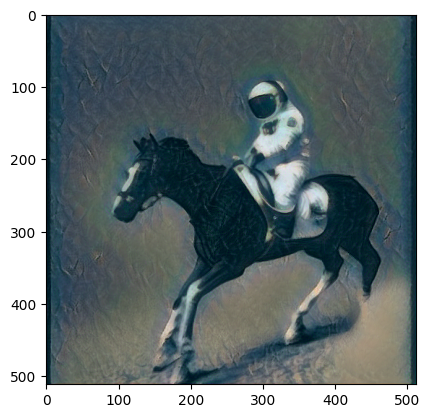

In [167]:
image = latent_to_img(latents_orig)
imshow(image)
image = latent_to_img(latents_styled)
imshow(image)
image =  run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                       latent_to_img(latents_orig), style_img, latent_to_img(latents_orig), num_steps=100,
                       style_weight=1000000, content_weight=1)
imshow(image)

In [ ]:
torch.cuda.empty_cache()